# Spotify Challenge - Clustering songs- Unsupervised Learning

🎯 The goal of this recap is to **cluster songs** using the **KMeans _(clustering algorithm)_** with a **PCA _(dimensionality reduction)_**

In [1]:
# Data Manipulation
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

# Data Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Pipeline and Column Transformers
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn import set_config
set_config(display = "diagram")

# Scaling
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler

# Cross Validation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict

# Unsupervised Learning
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans 

# STATISTICS
from statsmodels.graphics.gofplots import qqplot
# This function plots your sample against a Normal distribution, 
# to see whether your sample is normally distributed or not

## (1) The Spotify Dataset

In [2]:
from sklearn.utils import shuffle

spotify = shuffle(pd.read_csv('https://wagon-public-datasets.s3.amazonaws.com/Machine%20Learning%20Datasets/ML_spotify_data.csv'))
spotify.head()

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
7847,Take Me Away,['Keyshia Cole'],44,0.649,0.357,0.719,0,5,0.2550,-3.245,0.0321,96.738
4849,Coming Home,['Johnny Van Zant Band'],30,0.601,0.835,0.596,0,7,0.0476,-12.244,0.0305,102.760
1368,Warm Love,['Joan Armatrading'],29,0.570,0.444,0.181,0,10,0.1040,-18.037,0.0326,96.227
7468,Mi Iglesia,['René González'],44,0.543,0.285,0.412,0,0,0.0975,-11.595,0.0458,103.632
6478,"If You Leave - From ""Pretty In Pink""",['Orchestral Manoeuvres In The Dark'],41,0.636,0.910,0.757,0,0,0.1460,-8.686,0.0326,120.256


### (1.1) Basic Info

In [3]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 7847 to 8572
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   name          10000 non-null  object 
 1   artists       10000 non-null  object 
 2   popularity    10000 non-null  int64  
 3   danceability  10000 non-null  float64
 4   valence       10000 non-null  float64
 5   energy        10000 non-null  float64
 6   explicit      10000 non-null  int64  
 7   key           10000 non-null  int64  
 8   liveness      10000 non-null  float64
 9   loudness      10000 non-null  float64
 10  speechiness   10000 non-null  float64
 11  tempo         10000 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 1015.6+ KB


### (1.2) Working on the numerical features

🔢  Let's focus on the numerical features. Store the numerical features in a variable called `spotify_num`

In [4]:
spotify_num = spotify.select_dtypes(exclude='object')
spotify_num.head()

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
7847,44,0.649,0.357,0.719,0,5,0.2550,-3.245,0.0321,96.738
4849,30,0.601,0.835,0.596,0,7,0.0476,-12.244,0.0305,102.760
1368,29,0.570,0.444,0.181,0,10,0.1040,-18.037,0.0326,96.227
7468,44,0.543,0.285,0.412,0,0,0.0975,-11.595,0.0458,103.632
6478,41,0.636,0.910,0.757,0,0,0.1460,-8.686,0.0326,120.256


### (1.3) Correlations between features

❓ Visualize the correlation matrix (`PuRd` is a nice cmap choice)

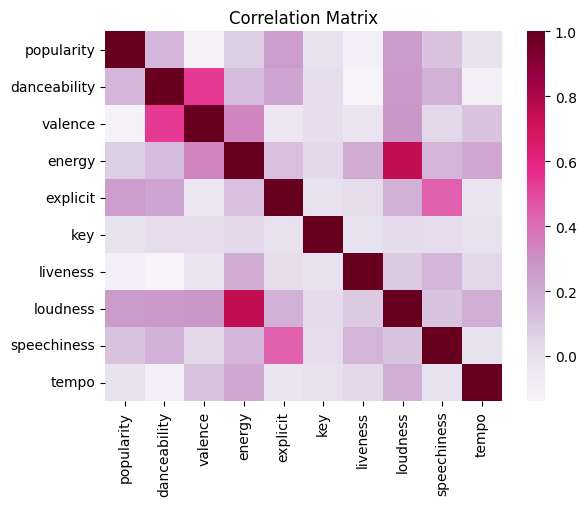

In [7]:
sns.heatmap(spotify_num.corr(),cmap='PuRd' )
plt.title('Correlation Matrix')
plt.show()

### (1.4) 3D Visualisation

🎨 Let's select 3 features of these songs and visualise them in a 3D-scatter-plot using `plotly` (📚 [plotly.express.scatter_3d](https://plotly.com/python-api-reference/generated/plotly.express.scatter_3d))

In [9]:
fig = px.scatter_3d(spotify_num, 
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    opacity=0.7, width=500, height=500
           )
fig.show()

🎯 _Remember: our goal is to cluster these songs_

## (2) Unsupervised Learning: Clustering

### (2.1) Vanilla KMeans

💫 Let's try our first _Unsupervised Algorithm_ 

❓ Fit a `kmeans_vanilla` model directly on our `spotify_num`, keeping default number of clusters
- Store its predicted labels in a variable called `labels_vanilla`

In [10]:
kmeans_vanilla = KMeans()

In [11]:
kmeans_vanilla.fit(spotify_num)

KMeans()

In [12]:
labels_vanilla = kmeans_vanilla.labels_
labels_vanilla

array([4, 0, 0, ..., 6, 3, 4], dtype=int32)

In [13]:
len(labels_vanilla)

10000

In [14]:
len(spotify_num)

10000

In [15]:
fig = px.scatter_3d(spotify_num, 
                    x = 'danceability',
                    y = 'energy',
                    z = 'speechiness',
                    color = labels_vanilla, width=500, height=500)
fig.show()

😭 It doesn't look good at all... who would pay 10-15 euros a month to Spotify, Apple Music, Deezer, Amazon Music or Tidal for that ?

### (2.2) Scaling + KMeans

🪜 Remember that the KMeans is a distance-based algorithm and that for any Machine Learning model, we should scale the features so that they start with an "equal chance" of impacting the predictions.

❓ Let's take a short approach to scaling and Robust-Scale everything. 

In [16]:
scaler = RobustScaler()
spotify_scaled = pd.DataFrame(scaler.fit_transform(spotify_num), columns=spotify_num.columns)
spotify_scaled.head()

,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo
0,0.421053,0.366534,-0.390443,0.266150,0.0,0.000000,0.752913,0.878993,-0.300926,-0.497314
1,-0.315789,0.175299,0.723776,-0.051680,0.0,0.285714,-0.486406,-0.554768,-0.337963,-0.358616
2,-0.368421,0.051793,-0.187646,-1.124031,0.0,0.714286,-0.149388,-1.477734,-0.289352,-0.509083
3,0.421053,-0.055777,-0.558275,-0.527132,0.0,-0.714286,-0.188228,-0.451366,0.016204,-0.338533
4,0.263158,0.314741,0.898601,0.364341,0.0,-0.714286,0.101584,0.012109,-0.289352,0.044348


❓ Fit the same default KMeans model number and compare results visually

In [17]:
kmeans_scaled = KMeans()
kmeans_scaled.fit(spotify_scaled)

KMeans()

In [18]:
labels_scaled = kmeans_scaled.labels_
labels_scaled

array([3, 2, 4, ..., 2, 7, 1], dtype=int32)

🧪Okay, our songs'clustering look better even if we can't rival yet with the datascience team at Spotify!

In [20]:
fig_scaled = px.scatter_3d(spotify_scaled,
                           x = 'danceability',
                           y = 'energy',
                           z = 'speechiness',
                           color = labels_scaled,
                           width=500, height=500)
fig_scaled.show()

🤪 It is a bit better but still messy...besides, we are only looking at one specific 3D slice of our dataset here!

### (2.3) Scaling + PCA + KMeans

🧑🏻‍🏫 What if we perform a PCA before running our clustering algorithm ? We could:
* reduce dimensionality to get a better visual feedback on our clustering
* use the orthogonality of the principal components so that the KMeans algorithm increases its clustering power

❓ Fit a PCA and reduce the dimensionality appropriately using the elbow method

In [24]:
features = spotify_scaled.columns

In [21]:
pca_base = PCA()
pca_base.fit(spotify_scaled)

PCA()

In [25]:
#Components Matrix 

W = pca_base.components_
W = pd.DataFrame(W.T, index=features, columns = [f'PC{i}' for i in range(1,11)])

In [27]:
W

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
popularity,0.034970,-0.071275,-0.181197,0.201993,0.679682,0.553592,0.013246,0.383209,0.030172,0.060797
danceability,0.060700,-0.123211,-0.338548,-0.647104,0.019207,0.371302,0.009734,-0.461253,0.281901,0.131247
valence,0.014996,0.011182,-0.303516,-0.437361,-0.376841,0.102081,-0.017889,0.657900,-0.332653,-0.141434
energy,0.055932,0.200275,-0.447366,0.140916,-0.067483,-0.332793,-0.009560,0.279704,0.734499,0.060406
explicit,0.058803,-0.018440,-0.038210,0.003927,0.088718,0.051799,-0.009832,-0.116344,0.132605,-0.976195
key,0.004875,0.000513,-0.017101,-0.002668,-0.007483,-0.023327,0.999354,0.008387,-0.010748,-0.013500
liveness,0.104111,0.941523,0.199621,-0.172433,0.086688,0.156240,0.006212,-0.026582,-0.020735,-0.003563
loudness,0.054497,0.183270,-0.695196,0.191042,0.181467,-0.259950,-0.019253,-0.306619,-0.498755,-0.000514
speechiness,0.987136,-0.110033,0.077486,0.036913,-0.038064,-0.032282,-0.004229,0.016072,-0.033227,0.047097
tempo,0.003474,0.083680,-0.171440,0.511564,-0.584191,0.581588,0.009297,-0.144027,0.038544,0.007473


Text(0, 0.5, 'Variance')

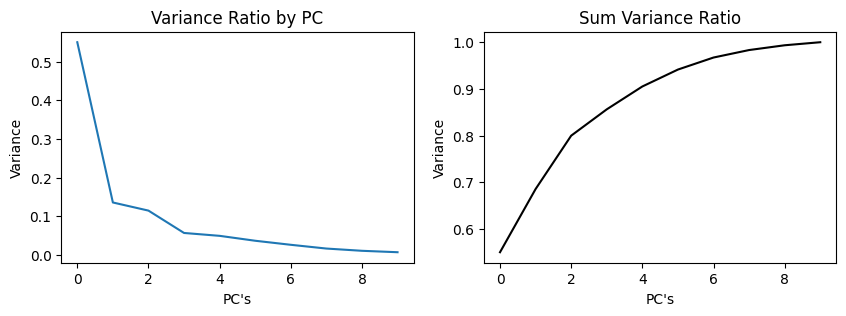

In [35]:
fig_elbow, axs = plt.subplots(1, 2, figsize=(10,3))

sns.lineplot(data=pca_base.explained_variance_ratio_, ax=axs[0])
axs[0].set_title('Variance Ratio by PC')
axs[0].set_xlabel("PC's")
axs[0].set_ylabel('Variance')

sns.lineplot(data=np.cumsum(pca_base.explained_variance_ratio_), ax=axs[1], color='black')
axs[1].set_title('Sum Variance Ratio')
axs[1].set_xlabel("PC's")
axs[1].set_ylabel('Variance')


In [36]:
pca = PCA(n_components=3)
pca.fit(spotify_scaled)

PCA(n_components=3)

❓ Project your $ 10000 \times 10$ `spotify_num_scaled` dataset into this new space with the number of principal components you decided to keep. Name it `spotify_proj`

In [39]:
spotify_proj = pca.transform(spotify_scaled)
spotify_proj = pd.DataFrame(spotify_proj, columns=[f'PC{i}'for i in range(1,4)])
spotify_proj

,PC1,PC2,PC3
0,-1.001595,0.516840,-0.890251
1,-1.281887,-0.872059,-0.170175
2,-1.330530,-0.947608,1.368692
3,-0.934480,-0.743774,0.405104
4,-1.090666,-0.159875,-0.886395
...,...,...,...
9995,-0.973347,-0.495516,-1.152427
9996,-0.389330,-0.990156,-0.082162
9997,-1.374288,-0.281424,0.415617
9998,-0.543113,2.761776,-0.326985


In [40]:
fig_scaled = px.scatter_3d(spotify_proj, x = 'PC1', y = 'PC2', z = 'PC3', opacity=0.7, width=500, height=500)
fig_scaled.show()

❓ Let's try a KMeans now and save the labels into `labels_kmeans_pca`

In [41]:
kmeans_pca = KMeans()
kmeans_pca.fit(spotify_proj)
labels_kmeans_pca = kmeans_pca.labels_

In [44]:
fig_scaled_pc = px.scatter_3d(spotify_proj,
                           x = 'PC1',
                           y = 'PC2',
                           z = 'PC3',
                           color = labels_kmeans_pca,
                          width=500, height=500)
fig_scaled_pc.show()

In [45]:
fig_scaled = px.scatter_3d(spotify_scaled,
                           x = 'danceability',
                           y = 'energy',
                           z = 'speechiness',
                           color = labels_kmeans_pca,
                          width=500, height=500)
fig_scaled.show()

### (2.4) Ideal number of clusters ? 

<details>
    <summary><i>Are there some number of clusters useless to try ? </i></summary>

* $K = 1$ means that you would have only 1 cluster with the whole dataset of $10000$ songs
* $K = 10000$ means that each of the $10000$ songs would be its own cluster!
* $K = 2$ means that you would have only 2 clusters with $5000$ songs each...
    
        
</details>        

In [46]:
nb_clusters_to_try = np.arange(1,20+1,1)
nb_clusters_to_try

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20])

❓ How would you decide on the number of clusters to use ❓

<details>
    <summary markdown='span'>Answer</summary>

Compare each model's inertia:
    
= Sum of Squared Residuals of each observation to their closest centroids  
= Sum of Within-Cluster Sum of Squares (WCSS)

$ inertia = \sum_{j=1}^{K} \sum_{x_i \in C_j} || x_i - \mu_j ||^2$

where:
* $K$ = number of clusters
* $C_j$ = cluster $j$
</details>

In [47]:
# Apply the elbow method to find the optimal number of clusters.

wcss = []

for K in nb_clusters_to_try:
    print('working with ' + str(K) + ' clusters...', flush=True)
    kmeans = KMeans(n_clusters = K)
    kmeans.fit(spotify_proj)
    wcss.append(kmeans.inertia_)
print("DONE !")

working with 1 clusters...
working with 2 clusters...
working with 3 clusters...
working with 4 clusters...
working with 5 clusters...
working with 6 clusters...
working with 7 clusters...
working with 8 clusters...
working with 9 clusters...
working with 10 clusters...
working with 11 clusters...
working with 12 clusters...
working with 13 clusters...
working with 14 clusters...
working with 15 clusters...
working with 16 clusters...
working with 17 clusters...
working with 18 clusters...
working with 19 clusters...
working with 20 clusters...
DONE !


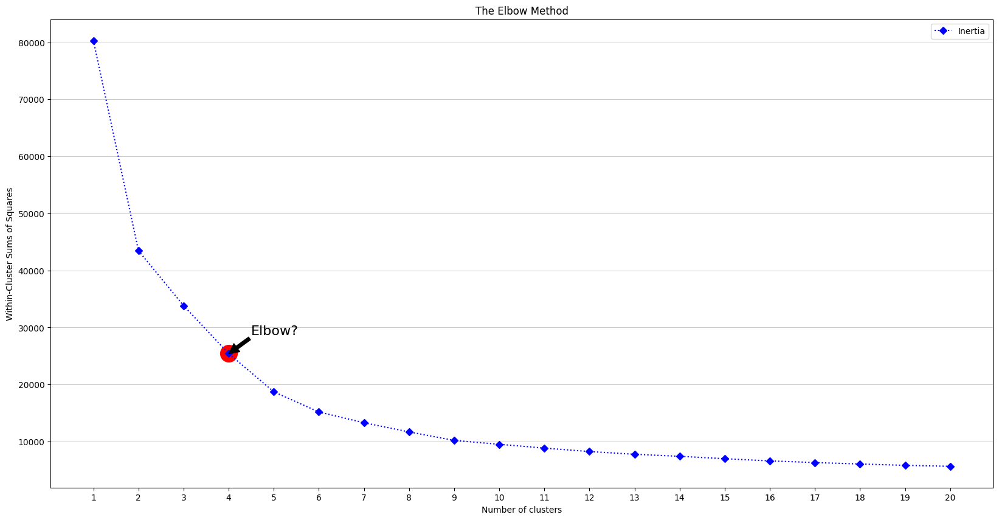

In [48]:
elbow_highlight = 4
with plt.style.context('seaborn-deep'):
    # figsize
    plt.figure(figsize=(20,10))
    # getting axes
    ax = plt.gca()
    # plotting
    ax.plot(nb_clusters_to_try, wcss,color="blue",linestyle=":",marker="D",label="Inertia")
    # customizing
    ax.legend(loc="upper right")
    ax.set_title('The Elbow Method')
    ax.set_xticks(nb_clusters_to_try)
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Within-Cluster Sums of Squares')
    ax.scatter(elbow_highlight,wcss[elbow_highlight-1],c='red',s=400)    
    # annotate
    ax.annotate("Elbow?", 
                (elbow_highlight,wcss[elbow_highlight-1]),
                (elbow_highlight+0.50,wcss[elbow_highlight-1]+5000), 
                arrowprops=dict(facecolor='black'),
                fontsize=16,
#                horizontalalignment='middle', 
                verticalalignment='top')
    
    ax.grid(axis="y",linewidth=0.5)
    plt.show()

### (2.5) Spotify : 6 daily mixes

🎵 If you are a Spotify user, you may have noticed that they offer you 6 daily mixes... So even if your previous elbow was not located at $K = 6$, let's try this value as the number of clusters!

In [50]:
spotify_clusters = 6

print('Working with ' + str(spotify_clusters) + ' clusters as in Spotify', flush=True)
print("-"*80)

kmeans = KMeans(n_clusters = spotify_clusters, max_iter = 300)

kmeans.fit(spotify_proj)

labelling = kmeans.labels_

fig_scaled = px.scatter_3d(spotify_proj,
                           x = 'PC1',
                           y = 'PC2',
                           z = 'PC3',
                           color=labelling, 
                           width=500, 
                           height=500)
fig_scaled.show()

Working with 6 clusters as in Spotify
--------------------------------------------------------------------------------


In [51]:
spotify_labelled = pd.concat([spotify,pd.Series(labelling)],axis=1).rename(columns={0:"label"})
spotify_labelled

,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
7847,Take Me Away,['Keyshia Cole'],44,0.649,0.357,0.719,0,5,0.2550,-3.245,0.0321,96.738,0
4849,Coming Home,['Johnny Van Zant Band'],30,0.601,0.835,0.596,0,7,0.0476,-12.244,0.0305,102.760,1
1368,Warm Love,['Joan Armatrading'],29,0.570,0.444,0.181,0,10,0.1040,-18.037,0.0326,96.227,0
7468,Mi Iglesia,['René González'],44,0.543,0.285,0.412,0,0,0.0975,-11.595,0.0458,103.632,0
6478,"If You Leave - From ""Pretty In Pink""",['Orchestral Manoeuvres In The Dark'],41,0.636,0.910,0.757,0,0,0.1460,-8.686,0.0326,120.256,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7863,Stereo Love - Extended Mix,"['Edward Maya', 'Vika Jigulina']",41,0.780,0.340,0.776,0,1,0.0829,-5.460,0.0374,127.017,0
3491,Wonderful Tonight,"['Kotch', 'Sly & Robbie']",25,0.692,0.741,0.405,0,2,0.0459,-13.067,0.0706,178.103,2
672,My Elusive Dreams,['Charlie Rich'],27,0.574,0.470,0.426,0,6,0.1640,-10.751,0.0250,77.446,0
5018,Vow,['Garbage'],30,0.486,0.362,0.911,0,5,0.6130,-4.180,0.0443,126.393,2


In [52]:
np.unique(labelling)

array([0, 1, 2, 3, 4, 5], dtype=int32)

In [53]:
spotify_labelled.label.value_counts()

0    5485
3    2088
2     981
4     810
5     576
1      60
Name: label, dtype: int64

In [54]:
daily_mixes = {}

for numero_cluster in np.unique(labelling):
    daily_mixes[numero_cluster] = spotify_labelled[spotify_labelled.label == numero_cluster]

In [61]:
daily_mixes.items()

dict_items([(0,                                                    name  \
7847                                       Take Me Away   
1368                                          Warm Love   
7468                                         Mi Iglesia   
5003  Andante spianato et Grande polonaise brillante...   
3213                                            Remorse   
...                                                 ...   
5432                                             Volare   
3755  Bach, J.S.: Brandenburg Concerto No. 6 in B-Fl...   
7863                         Stereo Love - Extended Mix   
672                                   My Elusive Dreams   
8572                                            Control   

                                                artists  popularity  \
7847                                   ['Keyshia Cole']          44   
1368                               ['Joan Armatrading']          29   
7468                                  ['René González']       

In [69]:
for key,value in daily_mixes.items():
    print("-"*50)
    print(f"Here are some songs for the playlist number {key}")
    print("-"*50)
    display(value.sample(20))

--------------------------------------------------
Here are some songs for the playlist number 0
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
2076,Fame - 2010 Remaster,['Duran Duran'],27,0.758,0.539,0.619,0,9,0.1020,-9.797,0.0470,117.224,0
1893,I Love The Nearness Of You,['Smokey Robinson'],22,0.656,0.890,0.745,0,9,0.2270,-5.288,0.0297,104.888,0
5518,Somebody's Gotta Feel This,['Kid Rock'],34,0.501,0.600,0.977,1,2,0.9250,-3.365,0.1800,170.711,0
6136,Celos,['Marc Anthony'],36,0.626,0.570,0.825,0,2,0.0303,-1.880,0.0489,91.947,0
6336,Down with the Sickness,['Disturbed'],35,0.695,0.941,0.876,1,3,0.1060,-4.262,0.0553,89.954,0
6091,Still,['Ben Folds'],42,0.379,0.274,0.214,0,5,0.1030,-12.795,0.0315,131.956,0
9086,I'm The Man - Remix,"['50 Cent', 'Chris Brown']",57,0.742,0.372,0.495,1,1,0.1240,-7.035,0.1610,98.060,0
9505,Fake ID,"['Riton', 'Kah-Lo']",66,0.746,0.604,0.862,0,8,0.2250,-6.110,0.0776,122.011,0
879,King Kong Song,['ABBA'],27,0.548,0.861,0.917,0,2,0.0910,-7.788,0.0444,155.426,0
428,One By One,['Looking Glass'],24,0.490,0.174,0.230,0,7,0.1120,-12.609,0.0333,126.184,0


--------------------------------------------------
Here are some songs for the playlist number 1
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
5268,Ese último momento,['Alejandro Sanz'],52,0.581,0.410,0.6200,0,8,0.0849,-6.544,0.0535,86.991,1
328,Flamingo - 2015 Remaster,['Todd Rundgren'],23,0.372,0.333,0.4990,0,10,0.2930,-8.648,0.0379,138.807,1
1513,Timing X / Space Junk,['DEVO'],21,0.552,0.965,0.5220,0,4,0.4450,-19.143,0.0348,129.746,1
5420,Mañana De Carnaval (Manha Do Carnaval),['Luis Miguel'],31,0.549,0.467,0.4670,0,2,0.2410,-9.335,0.0257,104.965,1
3037,Four Hugs A Day,['Charlotte Diamond'],27,0.808,0.608,0.3750,0,0,0.2910,-13.048,0.1030,131.534,1
7246,Feathers,['Coheed and Cambria'],41,0.551,0.700,0.9660,0,9,0.0858,-2.809,0.0597,132.937,1
444,Finale,['Joel Grey'],26,0.551,0.559,0.3840,0,3,0.1360,-14.663,0.1330,163.972,1
2953,Cumbia Chonera,['Don Medardo'],37,0.793,0.951,0.9020,0,8,0.3520,-7.790,0.0701,108.724,1
4884,Déjate Querer,['Los Tucanes De Tijuana'],37,0.675,0.922,0.6050,0,0,0.0547,-4.767,0.0371,150.901,1
2829,Lluvia,['Willie Rosario'],27,0.577,0.798,0.6880,0,7,0.2150,-9.770,0.0516,102.193,1


--------------------------------------------------
Here are some songs for the playlist number 2
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
1123,Inside Of My Guitar,['The Bellamy Brothers'],33,0.3070,0.3150,0.4100,0,7,0.2020,-15.143,0.0346,150.075,2
2468,"Meine Seele erhebet den Herren, BWV 648","['Johann Sebastian Bach', 'Yo-Yo Ma', 'Ton Koo...",26,0.0669,0.0697,0.0115,0,1,0.1050,-32.996,0.0462,61.000,2
5068,I Got Cha Opin - ' Remix,['Black Moon'],31,0.6730,0.8440,0.6070,0,8,0.1520,-12.032,0.1100,88.049,2
874,Duydum Ki Unutmuşsun,['Emel Sayın'],49,0.2550,0.4280,0.3050,0,4,0.1270,-11.132,0.0390,177.186,2
7168,Sleepers,['Saosin'],43,0.2820,0.3370,0.9770,0,2,0.3440,-3.723,0.0715,183.916,2
4165,The Chill Of An Early Fall,['George Strait'],27,0.4620,0.2660,0.2830,0,5,0.0912,-15.016,0.0267,149.407,2
351,Prologue,['Renaissance'],28,0.3440,0.4490,0.7440,0,11,0.3670,-9.439,0.0467,132.685,2
4423,Black Moon Creeping,['The Black Crowes'],32,0.3160,0.6590,0.9500,0,0,0.1070,-4.664,0.1390,183.999,2
2245,Guided Beam,['Scientist'],24,0.7570,0.7320,0.4510,0,10,0.1210,-12.216,0.1410,144.220,2
8631,Conrad,['Ben Howard'],57,0.5740,0.1780,0.3220,0,9,0.0836,-12.410,0.0264,81.603,2


--------------------------------------------------
Here are some songs for the playlist number 3
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
4726,Si Te Portas Mal,['Jay Pérez'],31,0.7220,0.9100,0.610,0,10,0.1550,-9.090,0.0306,105.890,3
8804,Sober,['Selena Gomez'],51,0.5730,0.5260,0.741,0,9,0.1040,-3.220,0.0788,92.021,3
2497,חי,['Ofra Haza'],32,0.6700,0.6150,0.648,0,9,0.1440,-5.534,0.0375,106.977,3
217,Surrender,['Diana Ross'],25,0.4960,0.8670,0.710,0,5,0.5390,-6.625,0.0851,88.348,3
3531,They Always come,['Dinosaur Jr.'],28,0.0993,0.1660,0.955,0,2,0.1630,-4.113,0.0947,161.034,3
8431,"Twinkle, Twinkle, Little Star",['The Wiggles'],49,0.3020,0.3830,0.385,0,2,0.2240,-6.662,0.0293,100.584,3
6249,"Poor Unfortunate Souls - From ""The Little Merm...",['Pat Carroll'],37,0.4080,0.4150,0.199,0,0,0.4020,-16.066,0.0765,75.904,3
9518,everythingoes,"['RM', 'NELL']",64,0.4670,0.1400,0.722,0,5,0.1280,-5.819,0.0303,92.014,3
5584,Docking the Pod,['Duster'],36,0.4940,0.0779,0.736,0,7,0.1050,-11.207,0.0386,118.976,3
9851,Smile,['Katy Perry'],73,0.7830,0.7490,0.912,0,0,0.3390,-3.713,0.2430,98.025,3


--------------------------------------------------
Here are some songs for the playlist number 4
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
454,Hello in There,['Bette Midler'],24,0.306,0.21400,0.0946,0,5,0.1260,-13.313,0.0339,83.440,4
3200,Run - 1999 Remaster,['Eric Clapton'],27,0.715,0.90100,0.8490,0,5,0.1100,-5.539,0.0260,111.719,4
176,Tomorrow Never Comes,['Elvis Presley'],29,0.427,0.49500,0.4800,0,6,0.2290,-14.030,0.0361,106.019,4
8632,Appreciated,['Rixton'],52,0.573,0.30600,0.7690,0,1,0.1010,-6.388,0.0364,106.021,4
9481,Talk Up (feat. Jay-Z),"['Drake', 'JAY-Z']",60,0.758,0.33400,0.4910,1,11,0.2920,-9.877,0.1380,140.121,4
5202,Hollywood Babylon - C.I Recording 1978,['Misfits'],34,0.511,0.73900,0.9310,1,11,0.2740,-9.206,0.0444,160.113,4
4297,Back In Black - Live - 1991,['AC/DC'],40,0.460,0.44700,0.9840,0,9,0.9370,-4.239,0.0657,96.468,4
6538,Fray,['Staind'],38,0.462,0.29300,0.7420,1,10,0.1020,-3.695,0.0376,146.878,4
4708,Introduction and Rondo capriccioso in A Minor,"['Camille Saint-Saëns', 'Dong-Suk Kang', 'Poli...",37,0.290,0.15600,0.0899,0,9,0.1050,-26.046,0.0470,90.888,4
1180,Look Good In Blue - 2001 Digital Remaster,['Blondie'],26,0.520,0.87200,0.5820,0,11,0.0680,-8.585,0.0314,137.284,4


--------------------------------------------------
Here are some songs for the playlist number 5
--------------------------------------------------


,name,artists,popularity,danceability,valence,energy,explicit,key,liveness,loudness,speechiness,tempo,label
2172,Dallas,['Joe Ely'],22,0.6500,0.7240,0.500,0,4,0.2740,-12.361,0.0464,137.178,5
3908,I Belong To You,['Whitney Houston'],33,0.7060,0.8140,0.695,0,8,0.2010,-9.459,0.0576,99.300,5
8072,Right Before My Eyes,['Cage The Elephant'],43,0.4880,0.3050,0.903,0,1,0.1310,-3.558,0.0373,132.057,5
7161,Soldier's Poem,['Muse'],49,0.5340,0.4750,0.408,0,2,0.3640,-12.670,0.0317,104.212,5
5965,No Te Detengas,['Yoskar Sarante'],36,0.9150,0.9340,0.600,0,6,0.1010,-6.966,0.0431,140.992,5
9551,In This Place,['Julia Michaels'],59,0.4050,0.4800,0.620,0,0,0.1080,-6.806,0.1420,195.881,5
6749,Wash Away (reprise),['Joe Purdy'],43,0.5120,0.6870,0.265,0,5,0.2040,-15.737,0.0350,85.937,5
8779,Work Song,['Hozier'],46,0.4840,0.2960,0.381,0,10,0.1110,-10.732,0.0625,118.567,5
6901,Hold Me Down,['Motion City Soundtrack'],40,0.5160,0.1620,0.854,0,1,0.0675,-6.224,0.0490,120.087,5
4784,De Mysteriis Dom Sathanas,['Mayhem'],41,0.0697,0.0387,0.816,0,9,0.3030,-6.410,0.0803,179.783,5


### (2.6) Pipeling the labelling process

❓ Wrap the three steps Scaling, PCA and KMeans in one pipeline called `pipeline_spotify`. Fit it and store the predicted labels into a variable called `labels`

In [70]:
pipeline_spotify = Pipeline([
    ('scaling', RobustScaler()),
    ('PCA', PCA(n_components=3)),
    ('KMeans', KMeans(n_clusters=4))])

pipeline_spotify.fit(spotify_num)

Pipeline(steps=[('scaling', RobustScaler()), ('PCA', PCA(n_components=3)),
                ('KMeans', KMeans(n_clusters=4))])

In [75]:
kmeans_model_pipe = pipeline_spotify.named_steps['KMeans']
labels = kmeans_model_pipe.labels_
labels

array([1, 1, 1, ..., 1, 3, 0], dtype=int32)

In [76]:
fig = px.scatter_3d(spotify_proj,
                           x = 'PC1', 
                           y = 'PC2',
                           z = 'PC3',
                           color = labels)
fig.show()

## (4) Tensorflow Projector 

You can use [projector.tensorflow.org](https://projector.tensorflow.org/) to visualize your data in nicer 3D plots
It also allows you to try several other clustering techniques, such as
- PCA
- T-SNE
- UMAP

<img src="https://wagon-public-datasets.s3.amazonaws.com/data-science-images/ML/ML_tsne_umap.png" alt="ttsne" width="700" height="700">

In [77]:
# To upload data, convert them first as tsv format, then click on "load" directly from the website
spotify_scaled.head(3000).to_csv('spotify.csv', index=False, header=False, sep='\t')
pd.DataFrame(labels).head(3000).to_csv('our_labels.csv', index=False, header=False, sep='\t')

❓ Upload your spotify dataset and vizualize the **PCA** and the **UMAP** version. 
- Also upload your "custom labels" determined previously, and "color by labels".
- Does your "labels" made from PCA look interesting in the UMAP too ?

## (Optional) Bibliography

**Theoretical explanations of these best 2D/3D dimensionality reduction techniques**
- 📺 [T-SNE: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=NEaUSP4YerM&t=14s)
- 📺 [UMAP: clearly explained (StatsQuest)](https://www.youtube.com/watch?v=eN0wFzBA4Sc)

**Spotify resources for projects**
- 📺 [Audio Analysis theory with the Spotify Web API](https://www.youtube.com/watch?v=goUzHd7cTuA)
- 🤖 Spotify API [docs](https://developer.spotify.com/documentation/web-api/)
- 🤖 Spotify API Wrappers [Tekore](https://github.com/felix-hilden/tekore) and [Spotipy](https://github.com/plamere/spotipy)